In [1]:
import pickle, fileinput
import json

In [2]:
import sys, os


In [91]:
files_list = os.listdir('replays/CoB')

In [92]:
files_list

['CotB-vvd.L-peanut.D-T17-20201107-0617',
 'CotB-hitandrun.K-Danniel_BR.N-T21-20201108-1644',
 'CotB-Danniel_BR.N-craken.D-T11-20200929-2107',
 'CotB-shigune.L-amikrop.R-T17-20200729-1544',
 'CotB-Dauntless.L-Fanjo32.K-T5-20201103-2149',
 'CotB-vvd.U-shigune.L-T25-20200724-0429',
 'CotB-Xplorer.U-Fanjo32.L-T27-20201002-1738',
 'CotB-gnidaoLer.D-craken.U-T11-20200921-1909',
 'CotB-hitandrun.K-peanut.U-T10-20201120-0308',
 'CotB-Matto.R-leadfox.L-T15-20200725-1133',
 'CotB-Xplorer.R-lIllI.N-T26-20200916-1703',
 'CotB-Fanjo32.N-Maboul.U-T17-20201107-2323',
 'CotB-NanRoig.R-Maboul.K-T19-20201121-2349',
 'CotB-leadfox.D-neki.U-T8-20200720-2256',
 'CotB-MasterBao.U-halder.R-T19-20200825-2121',
 'CotB-vvd.D-c4rLOs8.N-T33-20200918-0448',
 'CotB-shigune.R-craken.D-T11-20200812-2243',
 'CotB-Kral.L-igorbat99.D-T25-20200816-1136',
 'CotB-Zinnsoldat.N-craken.D-T11-20200926-0610',
 'CotB-shigune.D-amikrop.U-T24-20200910-0132',
 'CotB-Xplorer.R-EarthCake.D-T19-20200722-1500',
 'CotB-Estrada.D-craken

In [85]:
def extract_steps(file):
    pre_parts = file.split('[command]')
#     print(pre_parts[1])
    parts = [pre_part.split('[/command]')[0] for pre_part in pre_parts if '[/command]' in pre_part]
    return parts

In [51]:
filename = 'replays/CoB/CotB-vvd.L-peanut.D-T17-20201107-0617'

In [52]:
with open(filename, 'r') as f:
    text = f.read()

In [53]:
steps = extract_steps(text)


undo="no"
[speak]
id="peanut"
message="gl hf"
side="2"
time="1604726374"
[/speak]
[/command]

	


In [54]:
steps

['\nundo="no"\n[speak]\nid="peanut"\nmessage="gl hf"\nside="2"\ntime="1604726374"\n[/speak]\n',
 '\n\t\t[init_side]\n\t\t\tside_number=1\n\t\t[/init_side]\n\t\t[checkup]\n\t\t\t[result]\n\t\t\t\tnext_unit_id=18\n\t\t\t\trandom_calls=0\n\t\t\t[/result]\n\t\t[/checkup]\n\t',
 '\nundo="no"\n[speak]\nid="vvd"\nmessage="u2"\nside="1"\ntime="1604726386"\n[/speak]\n',
 '\n\t\tfrom_side=1\n\t\t[recruit]\n\t\t\ttype="Spearman"\n\t\t\tx=18\n\t\t\ty=5\n\t\t\t[from]\n\t\t\t\tx=21\n\t\t\t\ty=4\n\t\t\t[/from]\n\t\t[/recruit]\n\t\t[checkup]\n\t\t[/checkup]\n\t',
 '\ndependent="yes"\nfrom_side="server"\n[random_seed]\nnew_seed="8b6872a1"\n[/random_seed]\n',
 '\n\t\tfrom_side=1\n\t\t[recruit]\n\t\t\ttype="Cavalryman"\n\t\t\tx=18\n\t\t\ty=4\n\t\t\t[from]\n\t\t\t\tx=21\n\t\t\t\ty=4\n\t\t\t[/from]\n\t\t[/recruit]\n\t\t[checkup]\n\t\t[/checkup]\n\t',
 '\ndependent="yes"\nfrom_side="server"\n[random_seed]\nnew_seed="342bd623"\n[/random_seed]\n',
 '\n\t\tfrom_side=1\n\t\t[recruit]\n\t\t\ttype="Spearman"\n\t\

In [55]:
def extract_recruit(step):
    x_co = step.split('x=')[1].split('\n')[0]
    y_co = step.split('y=')[1].split('\n')[0]
    return (x_co, y_co)

In [56]:
for step in steps:
    if '[recruit]' in step:
        print(extract_recruit(step))
        break

('18', '5')


In [78]:
def extract_moves(step):
    x_co = step.split('x=\"')[1].split('\"\n')[0].split(',')
    y_co = step.split('y=\"')[1].split('\"\n')[0].split(',')
    return list(zip(x_co, y_co))

In [79]:
for step in steps:
    if '[move]' in step:
        print(extract_moves(step))
        break

[('21', '4'), ('20', '4'), ('19', '4'), ('18', '3'), ('17', '3')]


In [80]:
def make_hex(hex_info):
    return str(hex_info[0]) + '_' + str(hex_info[1])

In [81]:
make_hex(('18', '5'))

'18_5'

In [82]:
from collections import defaultdict


In [83]:
warm_map = defaultdict(int)

In [84]:
for i in range(1, 42):
    for j in range(1, 25):
        warm_map[str(i) + '_' + str(j)] = 0

In [93]:
warm_map = defaultdict(int)

for i in range(1, 42):
    for j in range(1, 25):
        warm_map[str(i) + '_' + str(j)] = 0
        
for file in files_list:
    filename = 'replays/CoB/' + file
    with open(filename, 'r') as f:
        text = f.read()
    steps = extract_steps(text)
    for step in steps:
        if '[move]' in step:
            moves = extract_moves(step)
            for move in moves[1:]:
                warm_map[make_hex(move)] += 1
        elif '[recruit]' in step:
            warm_map[make_hex(extract_recruit(step))] += 1
            
    

In [60]:
text

'abbrev=""\ncampaign=""\ncampaign_define=""\ncampaign_extra_defines=""\ncampaign_name=""\ncampaign_type="multiplayer"\ndifficulty="NORMAL"\nend_credits="yes"\nend_text=""\nend_text_duration="0"\nera_define=""\nlabel="2p — Caves of the Basilisk"\nmod_defines=""\nmp_game_title="peanut’s game"\noos_debug="no"\nrandom_mode=""\nscenario_define=""\nversion="1.14.14"\n[replay]\n\n\t[upload_log]\n\t[/upload_log]\n[/replay]\n[scenario]\ndescription="These caves were once the lair of Chak’kso Ney’yks, a legendary Elder Basilisk. The petrified forms of his victims remain as monuments to his savage power."\nexperience_modifier="70"\nhas_mod_events="yes"\nid="multiplayer_Basilisk"\nmap_data="_off^_usr, _off^_usr, _off^_usr, _off^_usr, _off^_usr, _off^_usr, _off^_usr, _off^_usr, _off^_usr, _off^_usr, _off^_usr, _off^_usr, _off^_usr, _off^_usr, _off^_usr, _off^_usr, _off^_usr, _off^_usr, _off^_usr, _off^_usr, _off^_usr, _off^_usr, _off^_usr, _off^_usr, _off^_usr, _off^_usr, _off^_usr, _off^_usr, _off

In [46]:
 pre_parts = text.split('[command]')

In [47]:
len(pre_parts)

663

In [95]:
warm_map["24_6"], warm_map["25_6"]

(660, 362)

In [156]:
max_hot = 0
for hexx in warm_map:
    max_hot = max(max_hot, warm_map[hexx])

In [157]:
max_hot

1558

In [98]:
def get_hexx_from_str(strr):
    q = strr.split('_')
    return (int(q[0]), int(q[1]))

In [99]:
get_hexx_from_str("24_6")

(24, 6)

In [102]:
file = open('map.png', 'rb')
image = pickle.loads(file)
print(image)

TypeError: a bytes-like object is required, not '_io.BufferedReader'

In [103]:
file.close()

In [106]:
import PIL

In [114]:
from PIL import Image, ImageDraw

In [115]:
image = Image.open('map.png')
image_copy = image.copy()

In [116]:
canvas = Image.new('RGB', (30, 60), 'cyan')

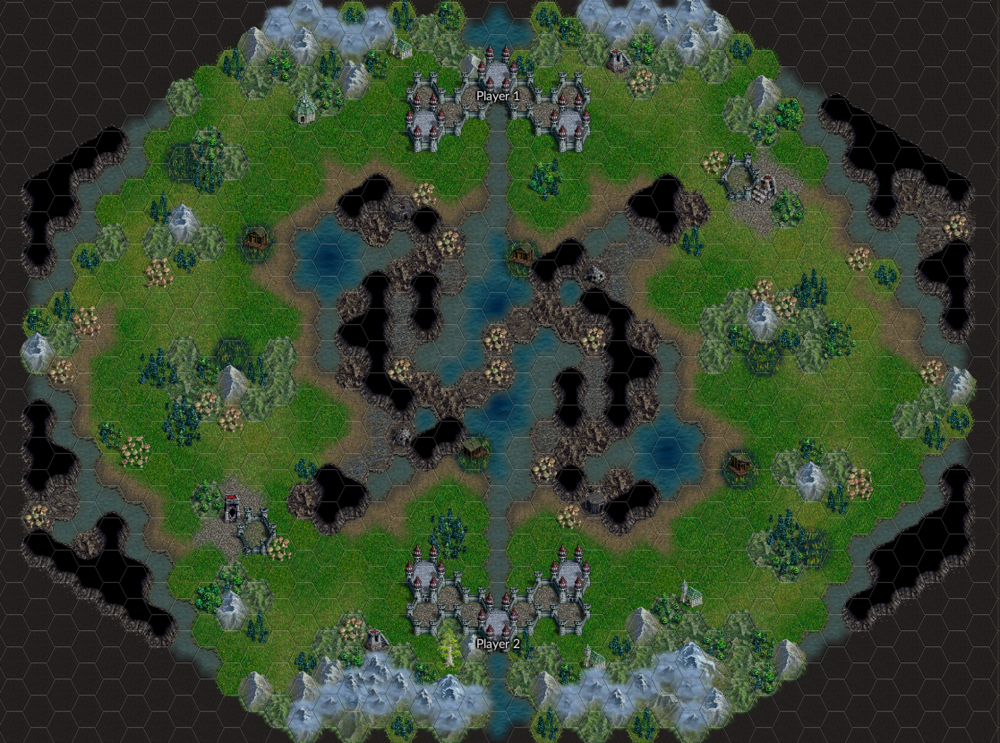

In [111]:
image

In [112]:
print(image.mode)

RGBA


In [113]:
print(image.size)

(2234, 1660)


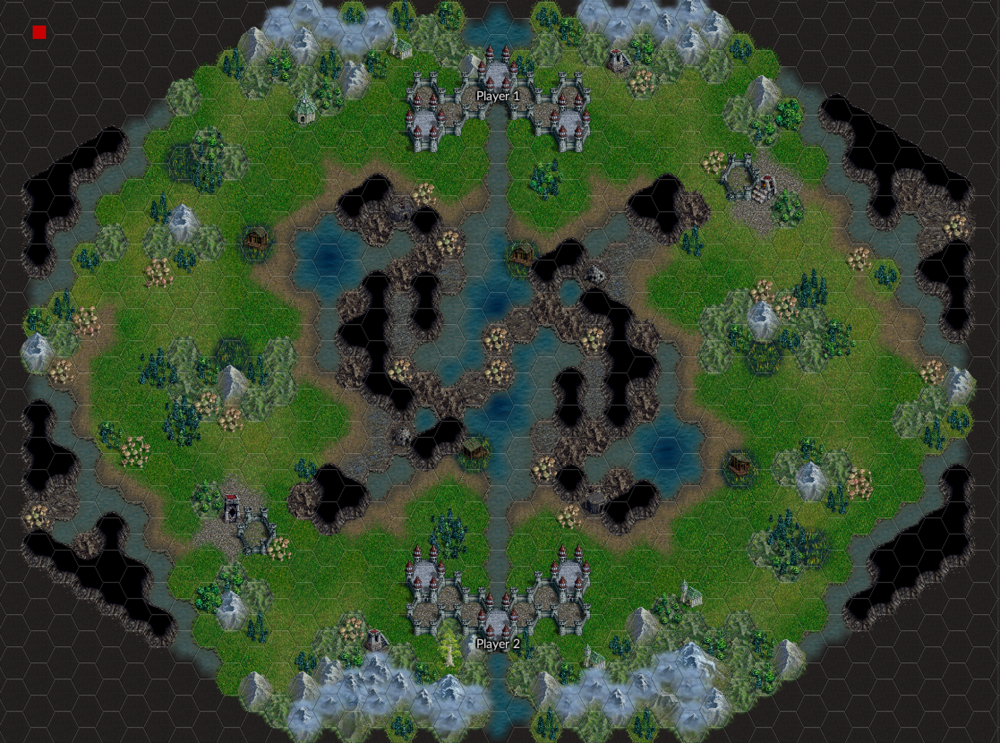

In [164]:
image_copy = image.copy()
tt = warm_map["1_1"] / max_hot
qq = 1 - tt
canvas = Image.new('RGB', (30, 30), (int(255 * tt) + 200, 0, 0))
image_copy.paste(canvas, (73, 57))
image_copy

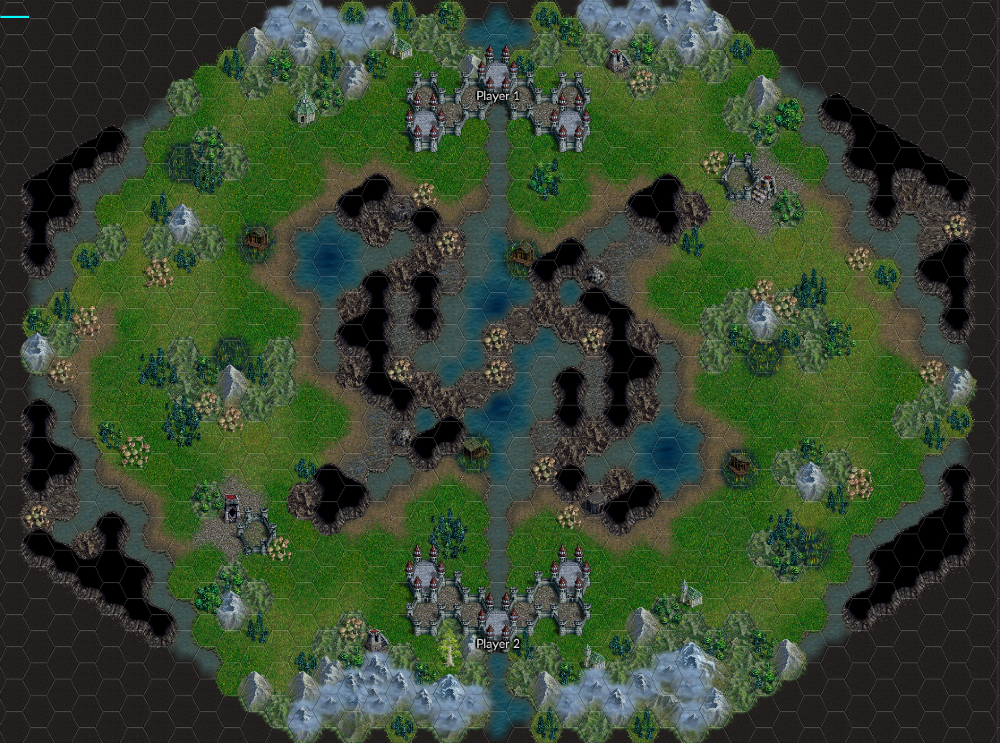

In [136]:
image_copy = image.copy()
canvas = Image.new('RGB', (, 5), 'cyan')
image_copy.paste(canvas, (1, 35))
image_copy

In [149]:
main_forward_shift = 54 # cool
main_down_shift = 72 # cool

In [211]:
def count_color(hot, max_hot, mult = 1):
    hott = min(int(255 * mult * hot / max_hot), 255)
    if hott == 0:
        return (0, 0, 0)
    return (hott, 0, 255 - hott)

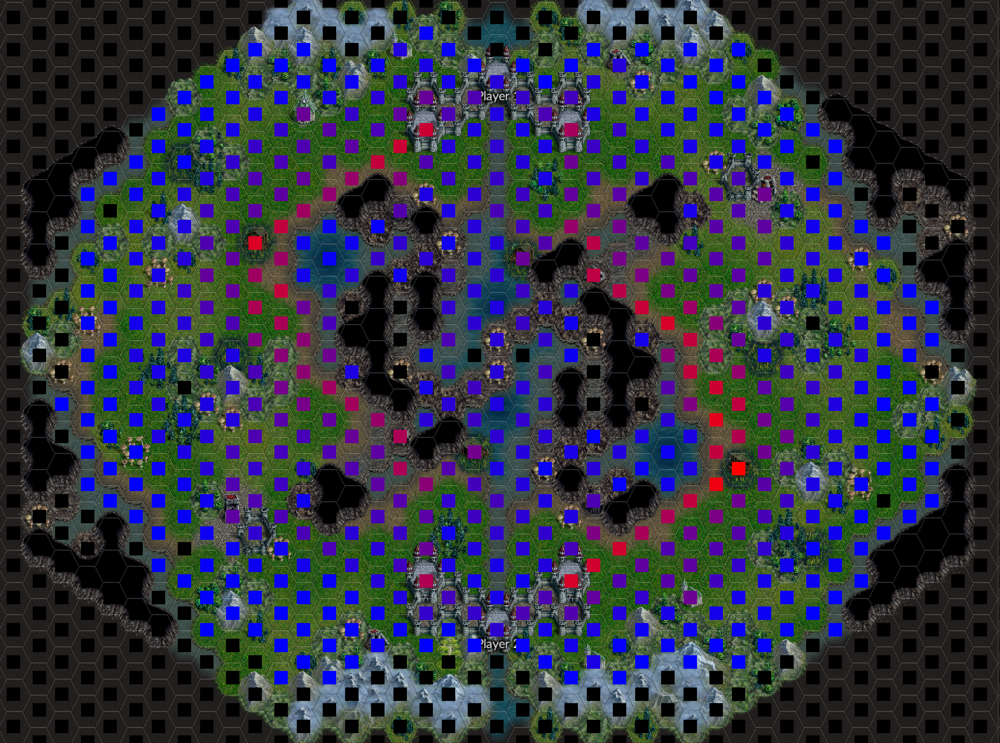

In [186]:
image_copy = image.copy()

for i in range(1, 43, 2):
    for j in range(1, 25):
        canvas = Image.new('RGB', (30, 30), count_color(warm_map[str(i) + "_" + str(j)]))
        image_copy.paste(canvas, (15 + (i - 1)*main_forward_shift , -70 + 22 + (j - 1) * main_down_shift))

for i in range(2, 43, 2):
    for j in range(1, 25):
        hot = min(int(255 * 2 * warm_map[str(i) + "_" + str(j)] / max_hot), 255)
        canvas = Image.new('RGB', (30, 30), count_color(warm_map[str(i) + "_" + str(j)]))
        image_copy.paste(canvas, (73 + (i - 2)*main_forward_shift , -70 + 57 + (j - 1) * main_down_shift))
image_copy

In [172]:
warm_map["28_7"]

0

In [187]:
image_copy.save("Add_blue_if_visited.png")

In [195]:
warm_map_1_player = defaultdict(int)

for i in range(1, 42):
    for j in range(1, 25):
        warm_map_1_player[str(i) + '_' + str(j)] = 0
        
for file in files_list:
    filename = 'replays/CoB/' + file
    with open(filename, 'r') as f:
        text = f.read()
    steps = extract_steps(text)
    for step in steps:
        if 'from_side=1' not in step:
            continue
        if '[move]' in step:
            moves = extract_moves(step)
            for move in moves[1:]:
                warm_map_1_player[make_hex(move)] += 1
        elif '[recruit]' in step:
            warm_map_1_player[make_hex(extract_recruit(step))] += 1

In [216]:
image_copy = image.copy()

max_hot_1_player = max(warm_map_1_player.values())

for i in range(1, 43, 2):
    for j in range(1, 25):
        canvas = Image.new('RGB', (30, 30),
                           count_color(warm_map_1_player[str(i) + "_" + str(j)], max_hot_1_player, 3))
        image_copy.paste(canvas, (15 + (i - 1)*main_forward_shift , -70 + 22 + (j - 1) * main_down_shift))

for i in range(2, 43, 2):
    for j in range(1, 25):
        canvas = Image.new('RGB', (30, 30),
                           count_color(warm_map_1_player[str(i) + "_" + str(j)], max_hot_1_player, 3))
        image_copy.paste(canvas, (73 + (i - 2)*main_forward_shift , -70 + 57 + (j - 1) * main_down_shift))
image_copy.save("max_hot_1_player.png")

In [197]:
warm_map_2_player = defaultdict(int)

for i in range(1, 42):
    for j in range(1, 25):
        warm_map_2_player[str(i) + '_' + str(j)] = 0
        
for file in files_list:
    filename = 'replays/CoB/' + file
    with open(filename, 'r') as f:
        text = f.read()
    steps = extract_steps(text)
    for step in steps:
        if 'from_side=2' not in step:
            continue
        if '[move]' in step:
            moves = extract_moves(step)
            for move in moves[1:]:
                warm_map_2_player[make_hex(move)] += 1
        elif '[recruit]' in step:
            warm_map_2_player[make_hex(extract_recruit(step))] += 1

In [217]:
image_copy = image.copy()

max_hot_2_player = max(warm_map_2_player.values())

for i in range(1, 43, 2):
    for j in range(1, 25):
        canvas = Image.new('RGB', (30, 30),
                           count_color(warm_map_2_player[str(i) + "_" + str(j)], max_hot_2_player, 3))
        image_copy.paste(canvas, (15 + (i - 1)*main_forward_shift , -70 + 22 + (j - 1) * main_down_shift))

for i in range(2, 43, 2):
    for j in range(1, 25):
        canvas = Image.new('RGB', (30, 30),
                           count_color(warm_map_2_player[str(i) + "_" + str(j)], max_hot_2_player, 3))
        image_copy.paste(canvas, (73 + (i - 2)*main_forward_shift , -70 + 57 + (j - 1) * main_down_shift))
image_copy.save("max_hot_2_player.png")

In [200]:
max(warm_map_2_player.values())

910

In [201]:
max(warm_map_1_player.values())

873

In [ ]:
for idd in max_hot_1_player:
    t1 = int(255 * mult * max_hot_1_player[idd] / max_hot)